In [1]:
import pathlib
import numpy as np 

import os
os.environ["NEURITE_BACKEND"] = "pytorch"
import neurite as ne
import warnings

In [2]:
class MedScribble:
    def __init__(self, path):
        
        if isinstance(path, str):
            path = pathlib.Path(path)
            
        self.path = path
        self.folders = sorted([x.parent for x in self.path.glob("*/*/*/scribble_1.npy")])
        assert len(self.folders)==64
    
    def __len__(self):
        return 3 * len(self.folders)
        
    def __getitem__(self, idx):
        
        folder_idx = idx // 3
        annotator_idx = idx % 3
        
        folder = self.folders[folder_idx]
        
        if (folder / "img.npy").exists():
            img = np.load(folder / "img.npy")
        else:
            warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
            img = np.zeros((256,256))
        
        if (folder / "seg.npy").exists():
            seg = np.load(folder / "seg.npy")
        else:
            warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")
            seg = np.zeros((256,256))
        
        manual_scribble = np.load(folder / f"scribble_{annotator_idx}.npy")
        
        return img, seg, manual_scribble
        

In [3]:
x = MedScribble(".")

In [4]:
len(x.folders)

64

In [5]:
len(x)

192

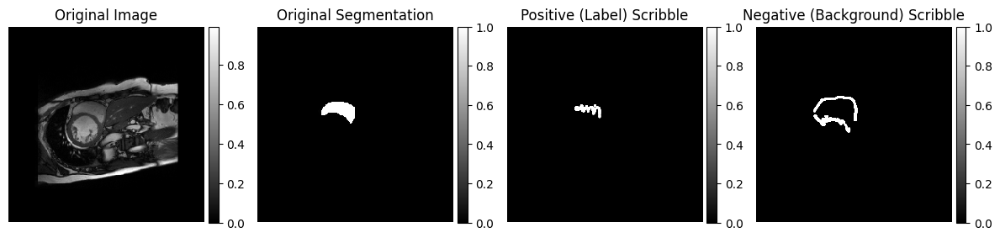

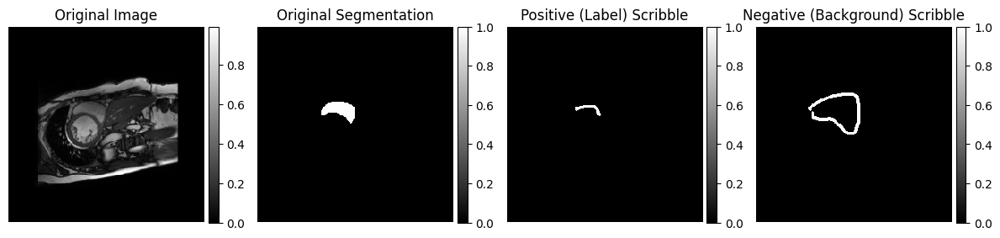

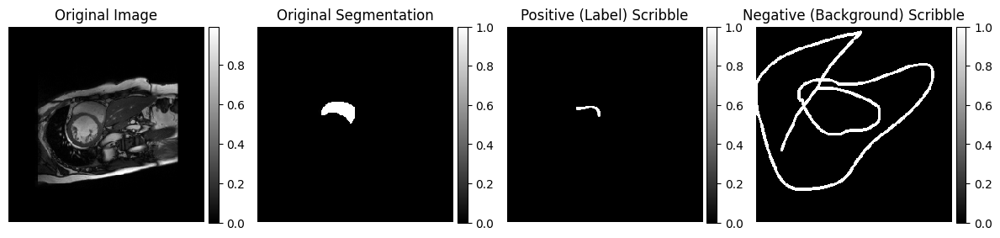

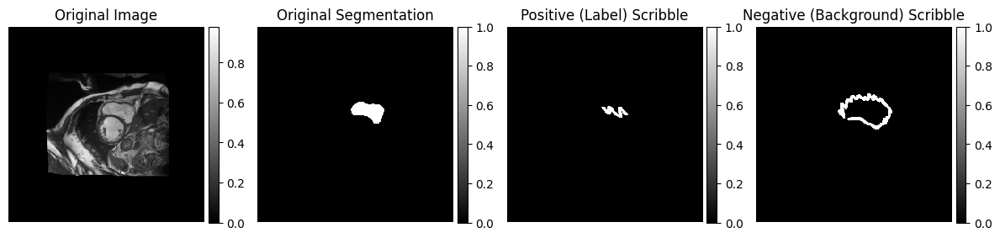

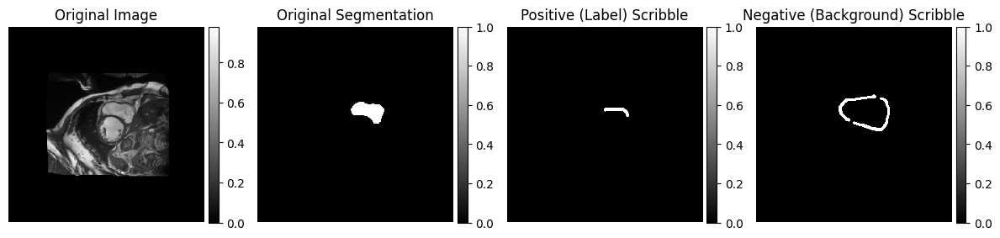

...

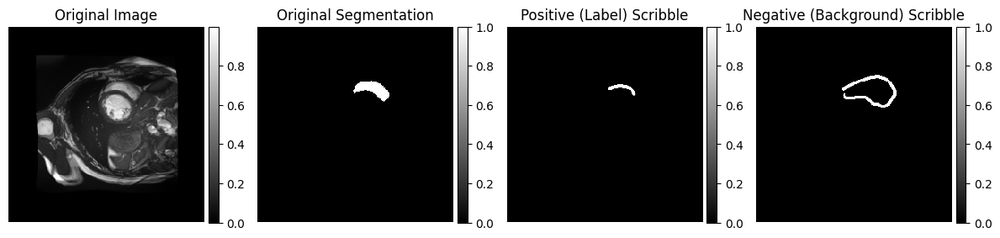

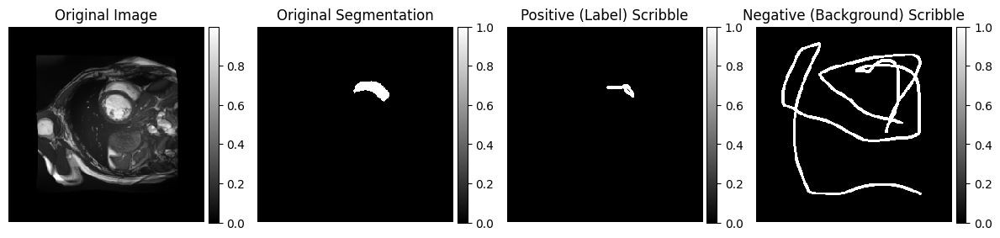

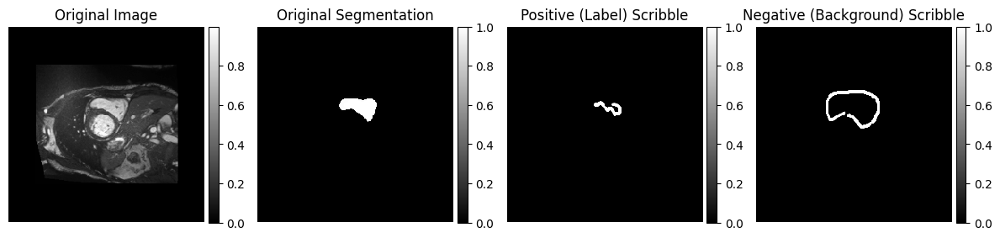

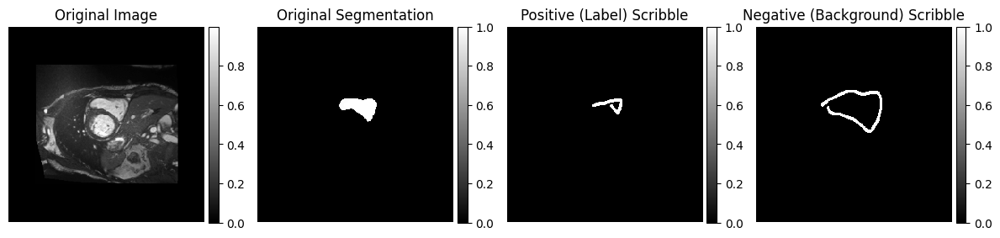

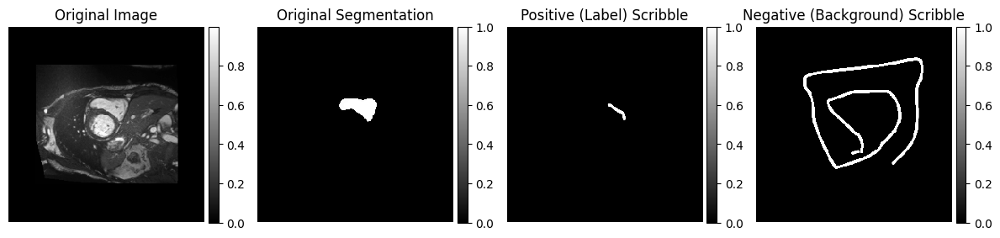

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for AbdominalUS/Real/h27_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for AbdominalUS/Real/h27_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


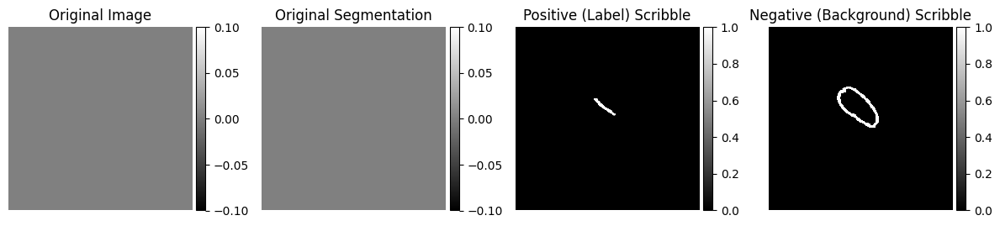

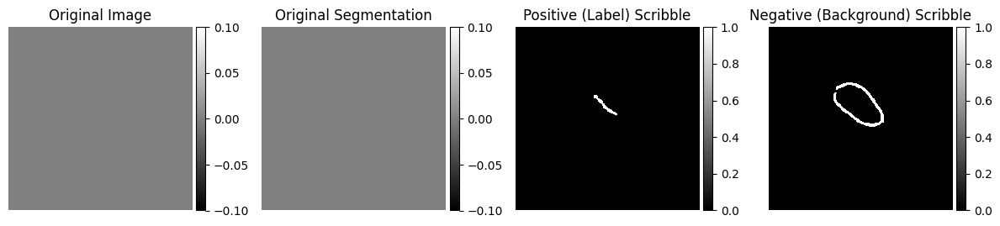

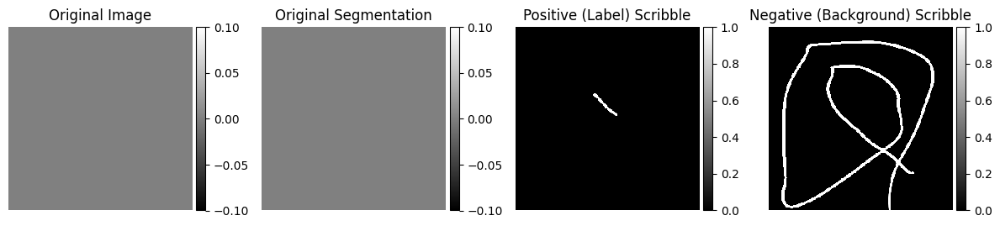

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for AbdominalUS/Real/h29_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for AbdominalUS/Real/h29_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


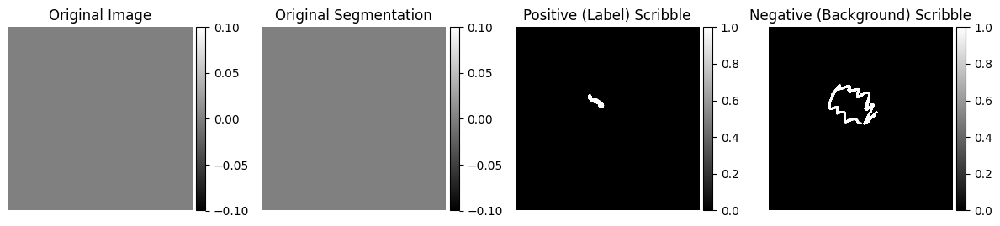

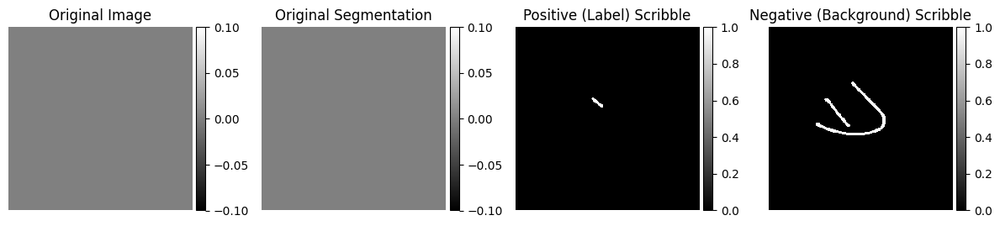

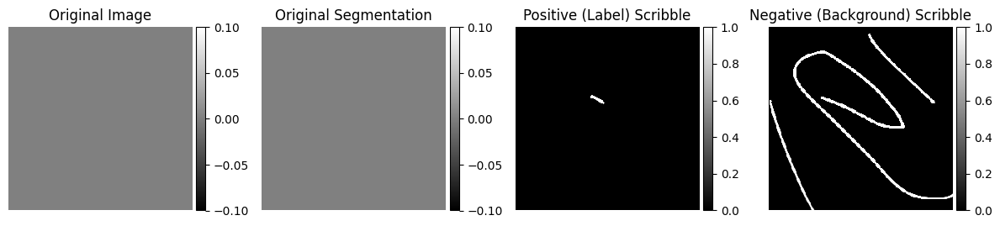

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for AbdominalUS/Real/h32_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for AbdominalUS/Real/h32_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


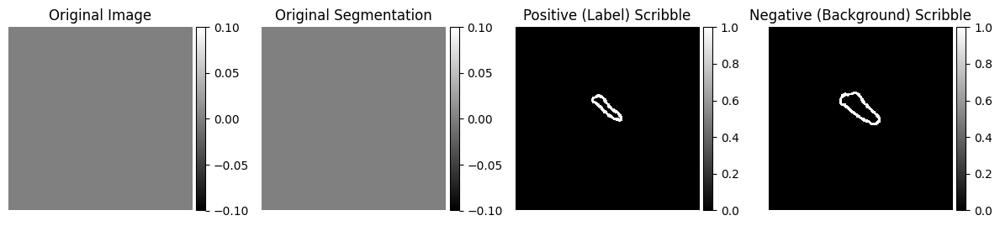

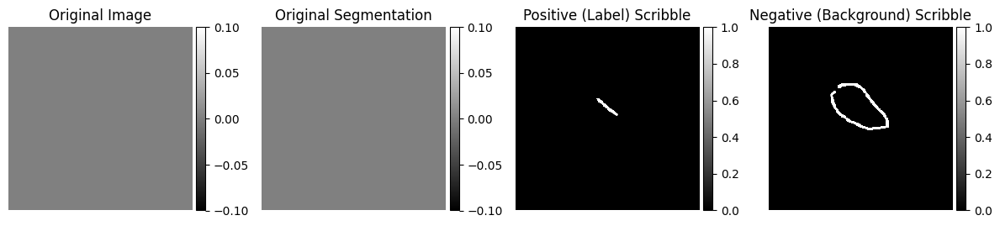

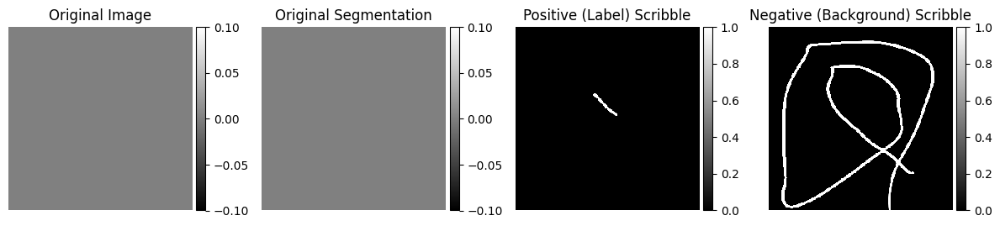

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for AbdominalUS/Real/h57_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for AbdominalUS/Real/h57_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


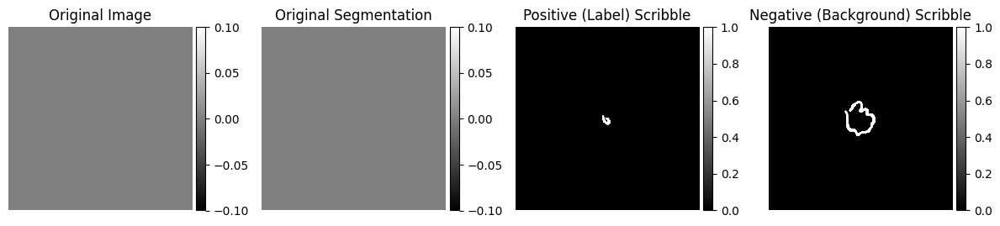

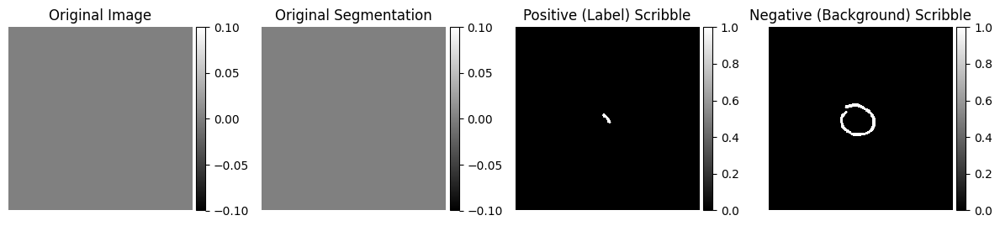

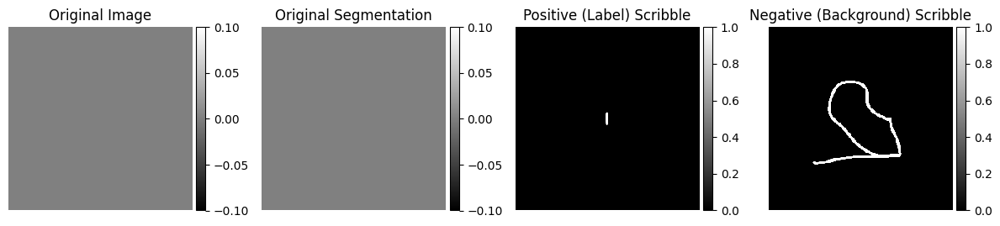

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for AbdominalUS/Real/h60_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for AbdominalUS/Real/h60_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


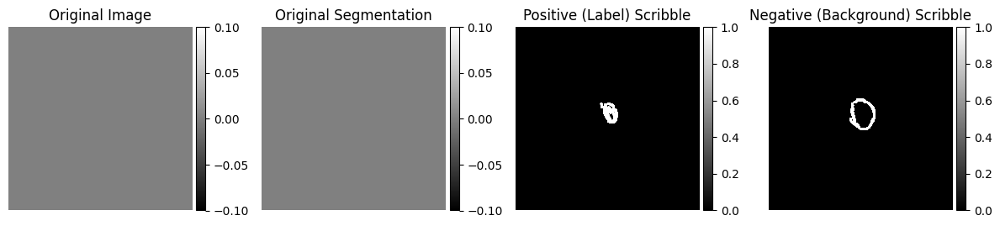

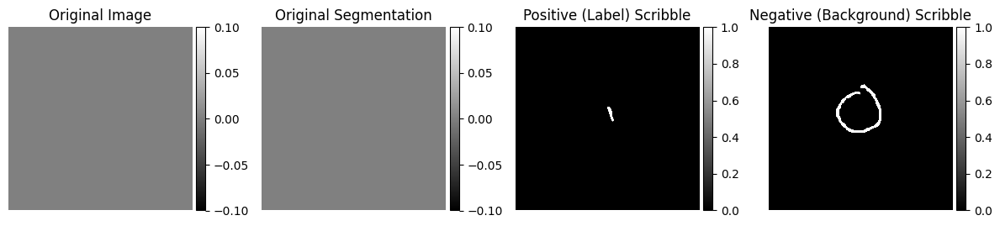

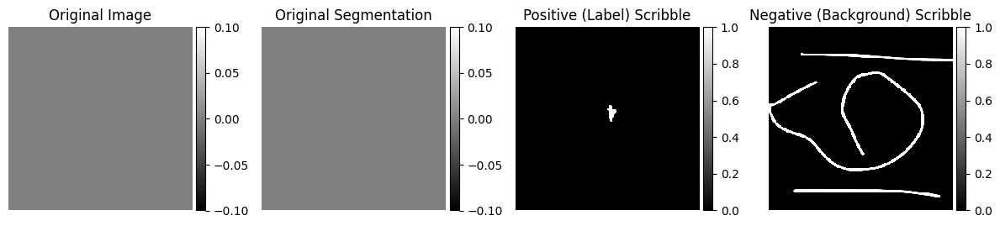

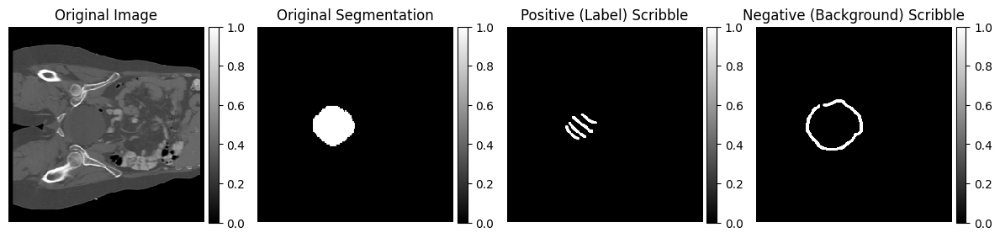

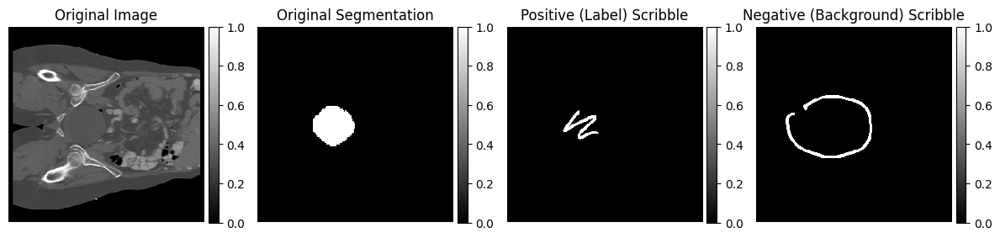

...

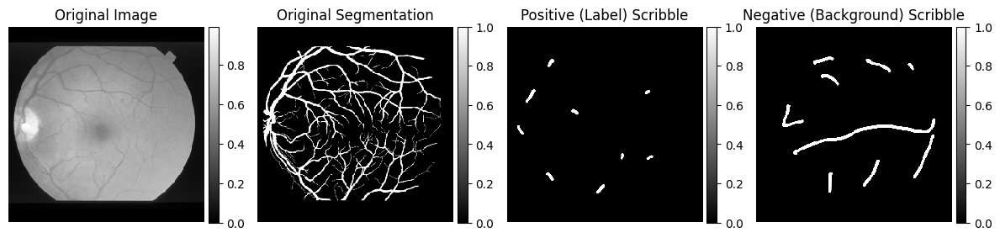

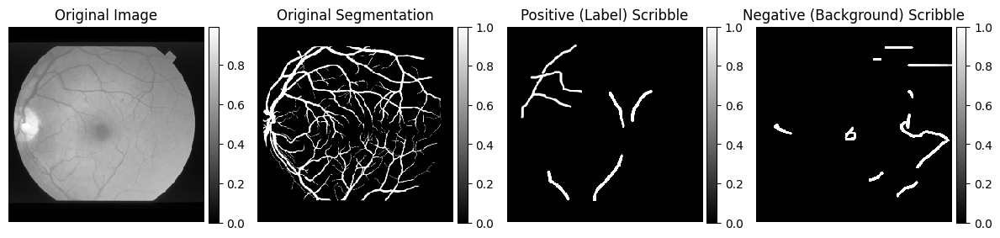

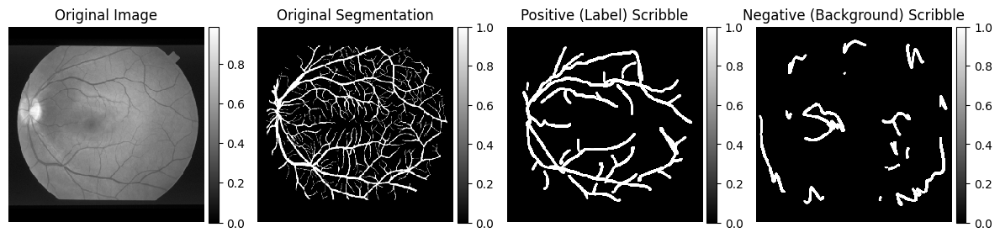

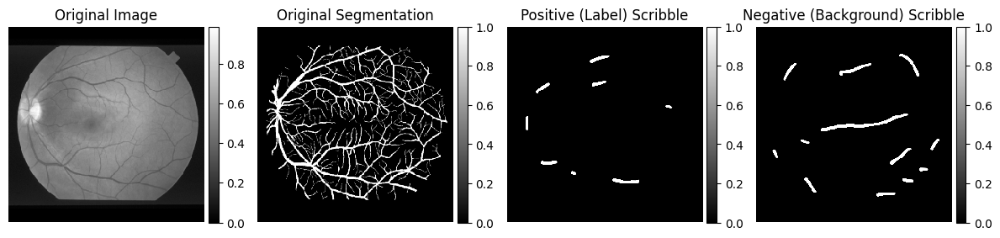

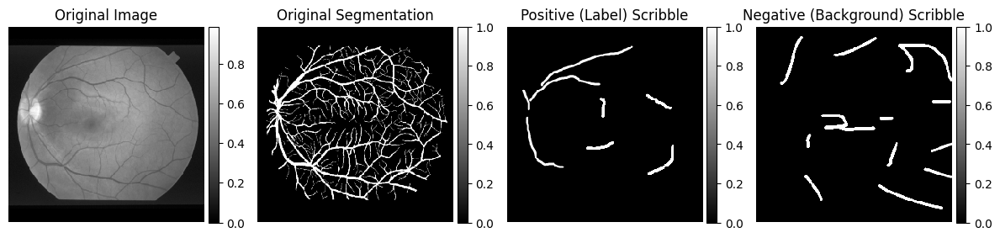

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for SpineWeb/Dataset7/Subject04_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for SpineWeb/Dataset7/Subject04_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


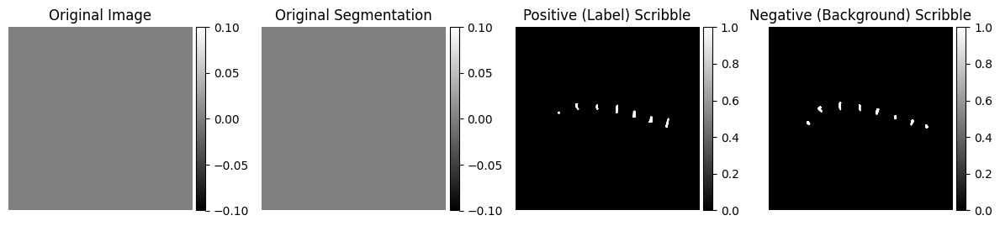

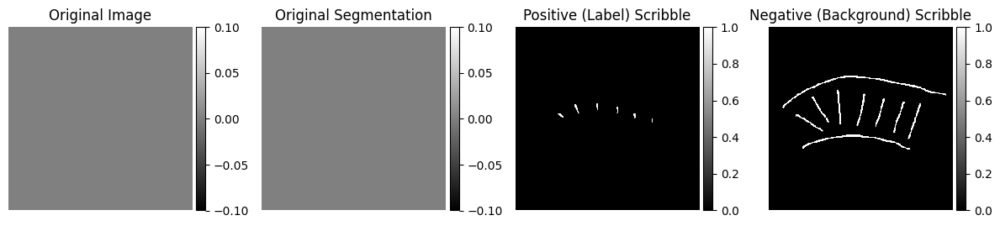

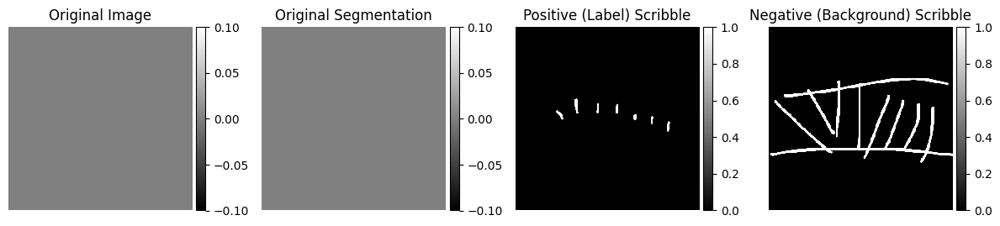

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for SpineWeb/Dataset7/Subject13_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for SpineWeb/Dataset7/Subject13_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


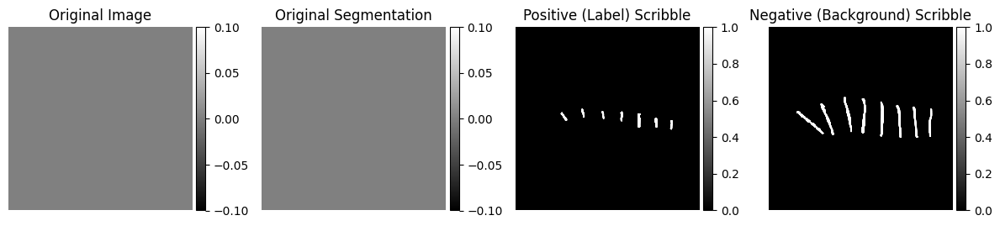

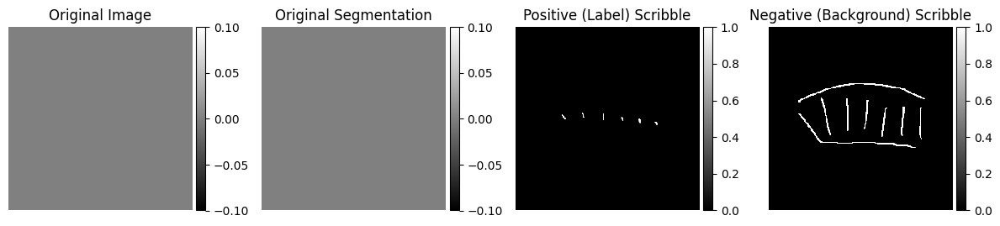

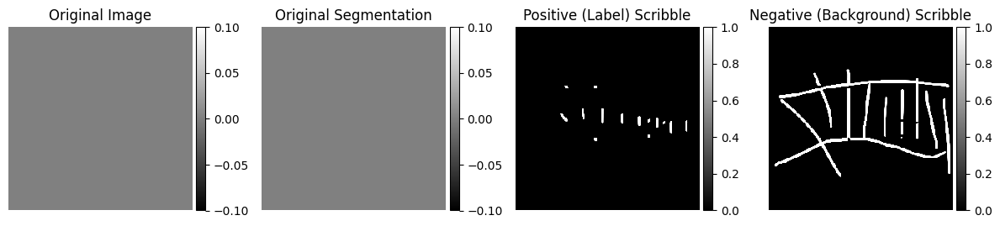

/tmp/ipykernel_119162/2241602850.py:24: UserWarning: img.npy missing for SpineWeb/Dataset7/Subject14_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"img.npy missing for {folder}. Please download data following instructions in README")
/tmp/ipykernel_119162/2241602850.py:30: UserWarning: seg.npy missing for SpineWeb/Dataset7/Subject14_axis0_midslice. Please download data following instructions in README
  warnings.warn(f"seg.npy missing for {folder}. Please download data following instructions in README")


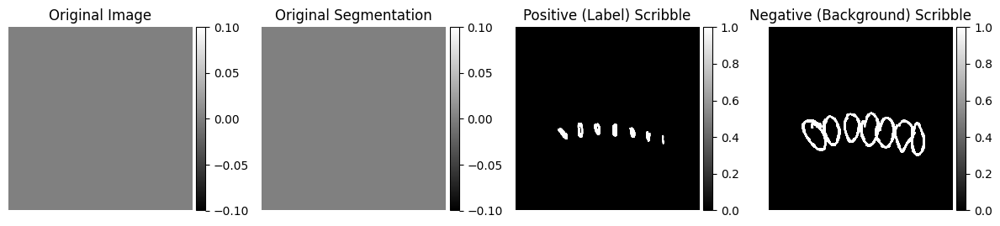

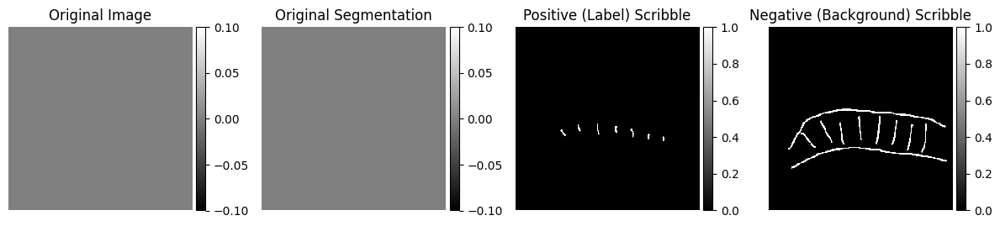

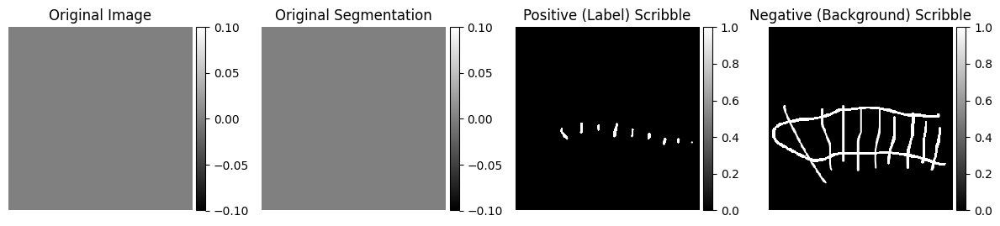

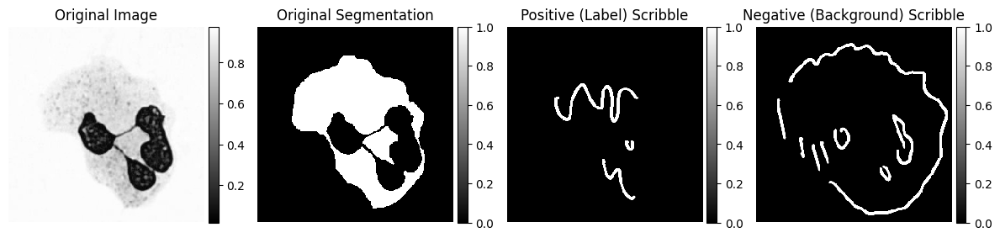

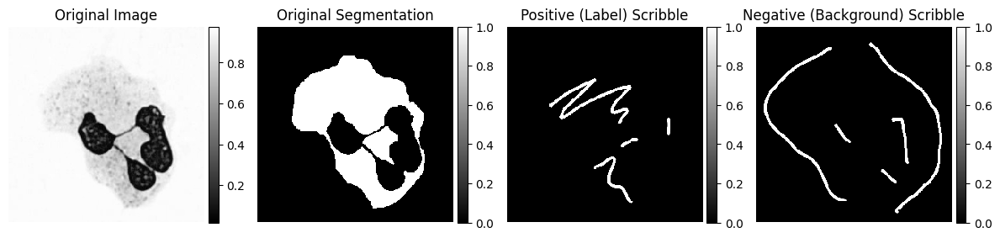

...

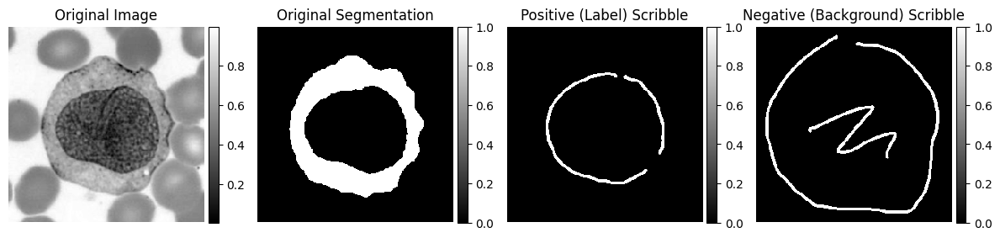

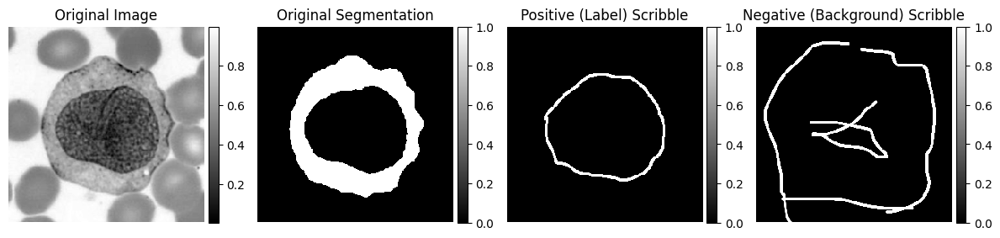

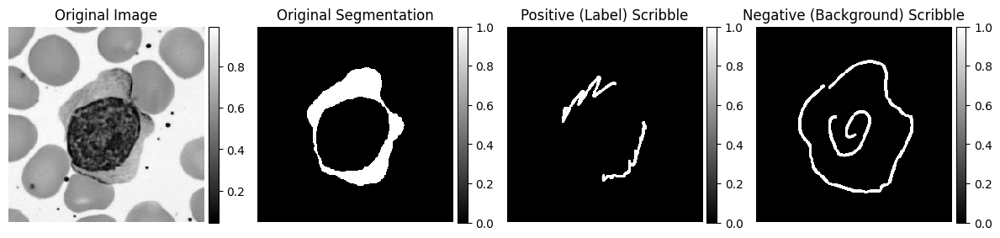

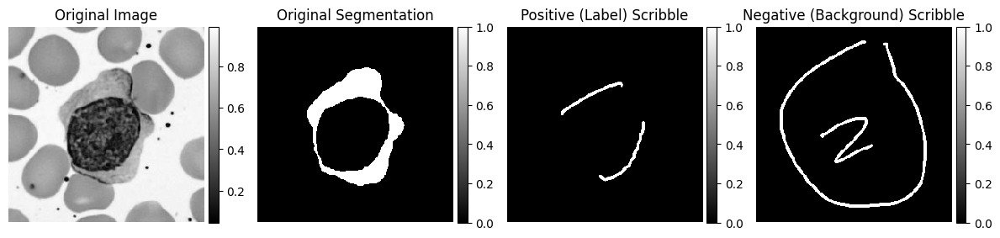

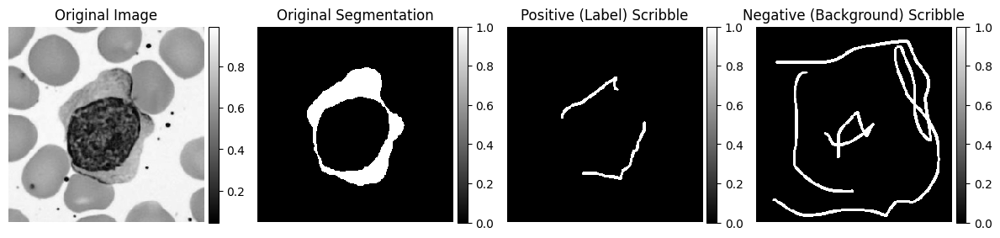

In [6]:
for i in range(len(x)):
    img, seg, manual_scribble = x[i]
    ne.plot.slices([img, seg, manual_scribble[0], manual_scribble[1]],
               titles = ["Original Image", "Original Segmentation", "Positive (Label) Scribble", "Negative (Background) Scribble"],
               do_colorbars=True, width=12)